<a href="https://colab.research.google.com/github/bingsen-wang/PowerElectronics/blob/main/PowerSwitchingDevices_MOSFET_TransferCurve_Temperature.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<center><h1><b>Transfer Curves of Power MOSFET: Temperature Dependency
</h1></b>

Dr. Bingsen Wang

1/3/2024
</center>

#Transfer Conductance

In active region, the drain current $i_D$ is independent from the drain-source voltage and only depends on the gate-source voltage.
$$ i_D =  K(v_{GS}-V_{th})^2 \tag{1}$$
where $K$ is a constant determined by the physical parameters of the device.

The slope of the $i_D$-$v_{GS}$ curve is the **transfer conductance** $g_m$
$$g_m = \frac{\partial i_D}{\partial v_{GS}}\tag{2}$$

#Temperature Dependency

##Constant $K$

Constant $K$ in (4) is temperature dependent since $K$ is proportional to carrier mobility. Let $K_0$ be the constant at reference temperature $T_0$ in Kelvin. At temperature $T$, the constant is determined by
$$K(T) = K_0 \left(\frac{T}{T_0}\right)^{k_\mu}\tag{5}$$
where $k_\mu$ is the fitting parameter with typical value of -1.5.

##Gate Threshold Voltag $V_{th}$

Let the threshold voltage at reference temerpature $T_0$ be $V_{th0}$. The threshold voltage at $T$ can be approximated as linear decrease
$$V_{th}(T) = V_{th0} + k_{th}(T-T_0) \tag{6}$$

#Python Code
The Python code illustrates the transfer conductance power MOSFETs.

0
1
2
3
4
5


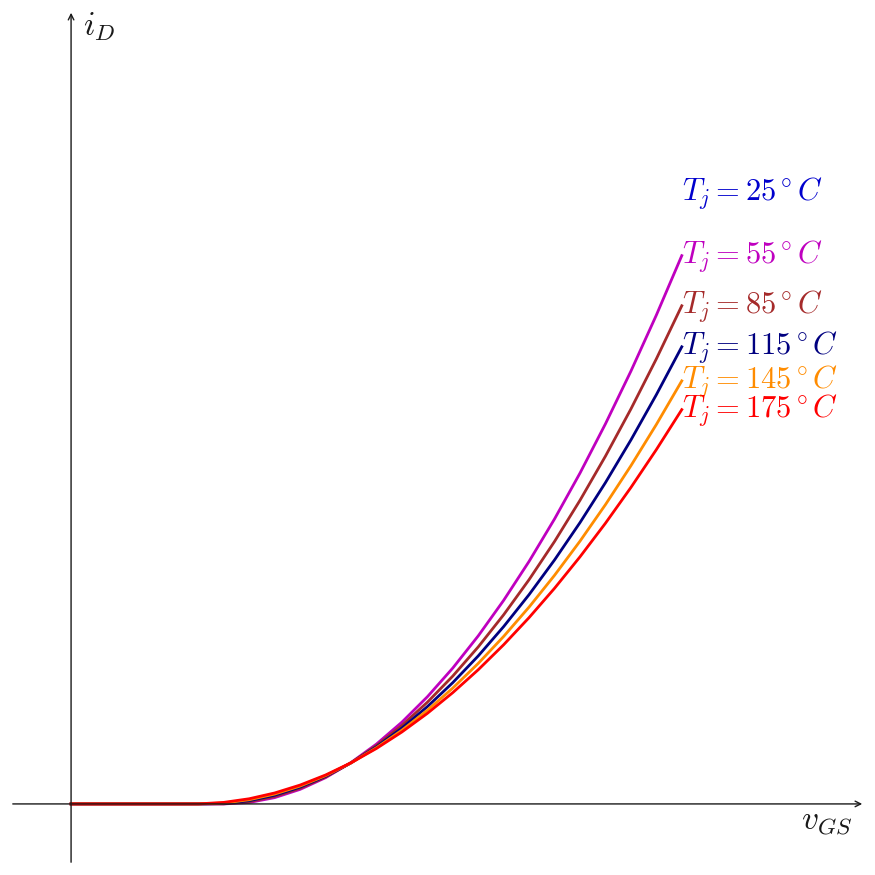

In [25]:
import matplotlib
from os import linesep
from numpy import linspace,heaviside
import matplotlib.pyplot as plt
from matplotlib import animation,rc
rc('animation', html='jshtml')
plt.rcParams.update({"font.family" : "sans serif","mathtext.fontset" : "cm"})

def Vth_T(T,kth,Vth0,T0):
  return Vth0+kth*(T-T0)

def K_T(T,T0,K0,ku):
  return K0*(T/T0)**ku

def iD_transfer(vGS,Vth,K): #ohmic and active regions
  return K*(vGS - Vth)**2*heaviside(vGS-Vth,0)

#parameters
# clst=['lightskyblue','violet','aqua','cornflowerblue','yellow','w',(.1,.1,.1)] #colors dark bg
clst=['mediumblue','m','brown','navy','darkorange','r',(.1,.1,.1),'w'] #colors light bg
Nf = 25
T0 = 25 # reference temperature in deg C
K0=1 # constant K at reference temperature T0
ku = -1.5 # fitting parameter
Vth0 = 4 # threshold voltage at reference temperature T0
Tmax = 175 # max temperature
Vth_max = 3 #threshold voltage at temerature Tmax
kth = (Vth_max - Vth0)/(Tmax - T0)
T = linspace(T0,Tmax,6) #temperature series for plotting
K=1 #determined by phsysical parameters such as material and device geometry
vGS = linspace(0,15,Nf)
iD_lst=[]
for Tk in T:
  iD_lst.append(iD_transfer(vGS, Vth_T(Tk+273,kth,Vth0,T0+273), K_T(Tk+273,T0+273,K0,ku)))
vGS_max = max(vGS)
iD_max = max(iD_lst[0])

#set up figures
fig = plt.figure(figsize=(9,9),facecolor=clst[-1])
ax_frame = [[0, 0, .95, .95], [-.1,1.3], [-.1,1.3]]# [pos-boundary, xlim, ylim]
xn,xm,yn,ym = ax_frame[1]+ax_frame[2]
ax=fig.add_axes(ax_frame[0],xlim=ax_frame[1], ylim=ax_frame[2],fc='none',) #no face color
ax.axis('off')
ax.annotate("", (xm, 0), (xn, 0),arrowprops={'arrowstyle':"->",'color':clst[-2]}) #x-axis
ax.annotate("", (0,ym), (0,yn),arrowprops={'arrowstyle':"->",'color':clst[-2]}) #y-axis
ax.text(xm-.02,0,r'$v_{GS}$',size=24,va='top',ha='right',color=clst[-2]) #x-axis label
ax.text(.02,ym,r'$i_{D}$',size=24,va='top',color=clst[-2]) #x-axis label
# ax.text(.7,1,'MOSFET Transfer Curve',ha='center',size=36,color=clst[2])
lines_iD=[]
for i in range(len(T)):
  lines_iD.append(ax.plot([],[],lw=2,color=clst[i%6])[0])
line_tangent = ax.plot([],[],lw=1.5,color=clst[4])[0]
line_dot = ax.plot([],[],ls='',marker='o',markersize = 8, color=clst[4])[0]
txt_gm = ax.text(0,0,r'$g_m=\frac{\partial i_D}{\partial v_{GS}}$',size=22,
                 color=clst[-2],va='top',alpha=0)
# animation function. This is called sequentially
def animate(i):
  ii = i%Nf
  k = int(i/Nf)
  if ii==Nf-1:
    print(k) #for monitoring
    ax.text(1,iD_lst[k][-1]/iD_max,'$T_j='+str(int(T[k]))+'^\circ C$',
            va='center',color=clst[k%6],size=22)
  lines_iD[k].set_data(vGS[:ii+1]/vGS_max,iD_lst[k][:ii+1]/iD_max)
  # lines_iD[0].set_data(vGS/vGS_max,iD_lst[k]/iD_max)
  return
anim = animation.FuncAnimation(fig, animate, frames=Nf*len(T), interval=20)
anim #uncomment to generate animation in the output area
# anim.save("MOSFET_transferConductance_temp.mp4", fps=50, dpi = 120) #uncomment to save